In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from os import walk
from os import listdir
from os.path import isfile, join
import statsmodels.api as sm
from pandas.plotting import scatter_matrix
from geopy.geocoders import Nominatim
import re
import numpy as np
import time
import folium
from folium.plugins import HeatMap
from folium.plugins import MarkerCluster
from folium.plugins import TimeSliderChoropleth
import datetime
from datetime import timedelta
#import unidecode
#import branca
import geopandas
import sodapy
import seaborn as sns
from scipy import stats
plt.rcParams["font.family"] = "Helvetica"
plt.rcParams.update({'font.size': 12})

In [ ]:
%%time
df_dep_mun = pd.read_csv('local\data\_DepartamentosMunicipios.csv', encoding='utf-8-sig')
df_year = pd.read_csv('local\data\_DengueAnual.csv', encoding='utf-8-sig')
df_year = df_year[df_year['ANO'] != 2006]
df_semanal = pd.read_csv('local\data\_DengueSemanal.csv', encoding='utf-8-sig')
df_semanal = df_semanal[df_semanal['ANO'] != 2006]

Wall time: 419 ms


In [ ]:
df_year['ANO'] = df_year['ANO'].astype(int)
df_year['COD_DPTO'] = df_year['COD_DPTO'].astype(int)
df_year['COD_MUNICIPIO'] = df_year['COD_MUNICIPIO'].astype(int)
df_year['TOTAL'] = df_year['DENGUE'] + df_year['DENGUE GRAVE']
df_year['PCT TOTAL'] = df_year['TOTAL'] / df_year['POBLACION']
df_year['POR_100MIL'] = df_year["PCT TOTAL"]*df_year["POBLACION"]/100000
df_year['PCT MORTALIDAD'] = df_year['MORTALIDAD POR DENGUE'] / df_year['POBLACION']

In [ ]:
df_dep_mun['COD_DPTO'] = df_dep_mun['COD_DPTO'].astype(int)
df_dep_mun['COD_MUNICIPIO'] = df_dep_mun['COD_MUNICIPIO'].astype(int)
df_year = df_year.join(df_dep_mun[['DEPARTAMENTO', 'MUNICIPIO', 'COD_MUNICIPIO']].set_index('COD_MUNICIPIO'), on='COD_MUNICIPIO', rsuffix='_')
df_year["MUNICIPIO"] = df_year["MUNICIPIO"].str.replace("MARTHA","MARTA")

In [ ]:
df_year_tot = df_year[df_year["ANO"]<=2019].groupby("ANO").sum().mean()
"Muertes promedio:",df_year_tot["MORTALIDAD POR DENGUE"]

('Muertes promedio:', 98.76923076923077)

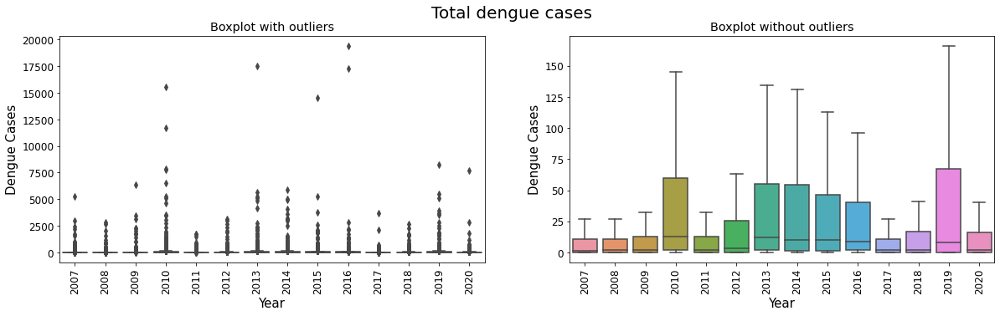

In [ ]:
df_group = df_year.copy()
fig, ax = plt.subplots(1, 2, figsize=(20,5), sharex=True)
sns.boxplot(data = df_group, x = 'ANO', y = 'TOTAL', showfliers = True, ax=ax[0])
sns.boxplot(data = df_group, x = 'ANO', y = 'TOTAL', showfliers = False, ax=ax[1])
ax[0].title.set_text('Boxplot with outliers')
ax[0].set_xlabel('Year', fontsize=15)
ax[0].set_ylabel('Dengue Cases', fontsize=15)
ax[1].title.set_text('Boxplot without outliers')
ax[1].set_xlabel('Year', fontsize=15)
ax[1].set_ylabel('Dengue Cases', fontsize=15)
fig.suptitle('Total dengue cases', fontsize=20)
plt.setp(ax[0].xaxis.get_majorticklabels(), rotation=90)
plt.setp(ax[1].xaxis.get_majorticklabels(), rotation=90)
fig.suptitle('Total dengue cases', fontsize=20)
plt.show()

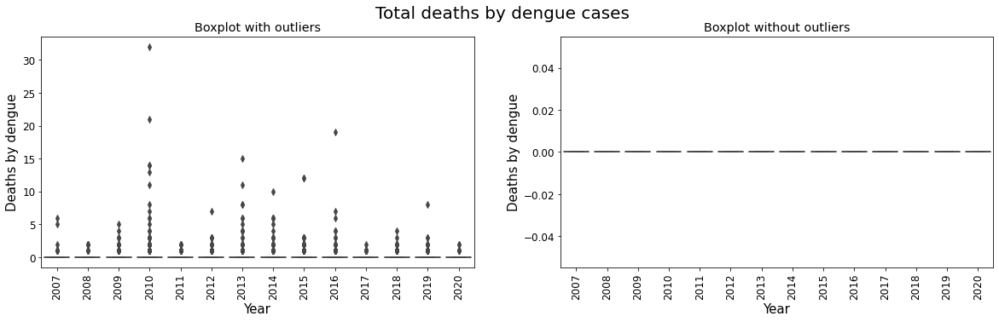

In [ ]:
df_group = df_year.copy()
fig, ax = plt.subplots(1, 2, figsize=(20,5), sharex=True)
sns.boxplot(data = df_group, x = 'ANO', y = 'MORTALIDAD POR DENGUE', showfliers = True, ax=ax[0])
sns.boxplot(data = df_group, x = 'ANO', y = 'MORTALIDAD POR DENGUE', showfliers = False, ax=ax[1])
ax[0].title.set_text('Boxplot with outliers')
ax[0].set_xlabel('Year', fontsize=15)
ax[0].set_ylabel('Deaths by dengue', fontsize=15)
ax[1].title.set_text('Boxplot without outliers')
ax[1].set_xlabel('Year', fontsize=15)
ax[1].set_ylabel('Deaths by dengue', fontsize=15)
fig.suptitle('Total deaths by dengue cases', fontsize=20)
plt.setp(ax[0].xaxis.get_majorticklabels(), rotation=90)
plt.setp(ax[1].xaxis.get_majorticklabels(), rotation=90)
plt.show()

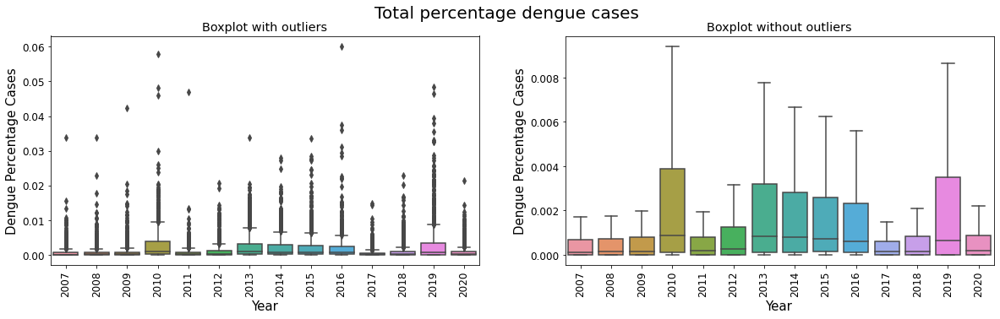

In [ ]:
df_group = df_year.copy()
fig, ax = plt.subplots(1, 2, figsize=(20,5), sharex=True)
sns.boxplot(data = df_group, x = 'ANO', y = 'PCT TOTAL', showfliers = True, ax=ax[0])
sns.boxplot(data = df_group, x = 'ANO', y = 'PCT TOTAL', showfliers = False, ax=ax[1])
ax[0].title.set_text('Boxplot with outliers')
ax[0].set_xlabel('Year', fontsize=15)
ax[0].set_ylabel('Dengue Percentage Cases', fontsize=15)
ax[1].title.set_text('Boxplot without outliers')
ax[1].set_xlabel('Year', fontsize=15)
ax[1].set_ylabel('Dengue Percentage Cases', fontsize=15)
fig.suptitle('Total percentage dengue cases', fontsize=20)
plt.setp(ax[0].xaxis.get_majorticklabels(), rotation=90)
plt.setp(ax[1].xaxis.get_majorticklabels(), rotation=90)
plt.show()

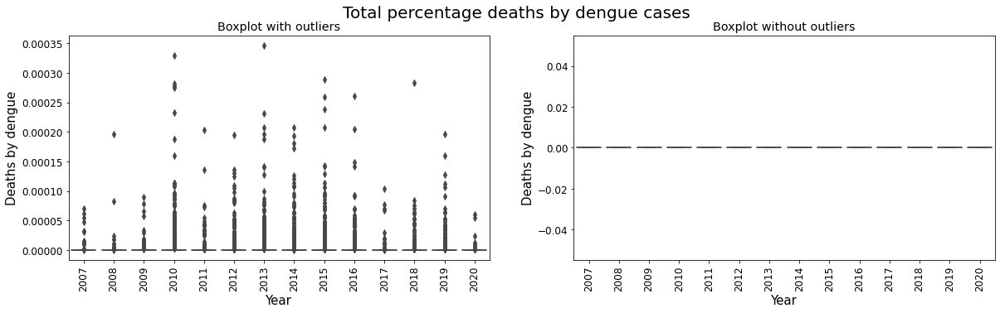

In [ ]:
df_group = df_year.copy()
fig, ax = plt.subplots(1, 2, figsize=(20,5), sharex=True)
sns.boxplot(data = df_group, x = 'ANO', y = 'PCT MORTALIDAD', showfliers = True, ax=ax[0])
sns.boxplot(data = df_group, x = 'ANO', y = 'PCT MORTALIDAD', showfliers = False, ax=ax[1])
ax[0].title.set_text('Boxplot with outliers')
ax[0].set_xlabel('Year', fontsize=15)
ax[0].set_ylabel('Deaths by dengue', fontsize=15)
ax[1].title.set_text('Boxplot without outliers')
ax[1].set_xlabel('Year', fontsize=15)
ax[1].set_ylabel('Deaths by dengue', fontsize=15)
fig.suptitle('Total percentage deaths by dengue cases', fontsize=20)
plt.setp(ax[0].xaxis.get_majorticklabels(), rotation=90)
plt.setp(ax[1].xaxis.get_majorticklabels(), rotation=90)
plt.show()

In [ ]:
df_year["DEPARTAMENTO"] = df_year["DEPARTAMENTO"].apply(lambda x: str(x).title())
df_compl = df_year.groupby(["DEPARTAMENTO","COD_MUNICIPIO","MUNICIPIO"]).sum("TOTAL").reset_index()
df_year[(df_year["ANO"]==2018)&(df_year["MUNICIPIO"].isin(["CUCUTA","MEDELLIN","VILLAVICENCIO"]))]

,ANO,COD_MUNICIPIO,COD_DPTO,DENGUE,DENGUE GRAVE,MORTALIDAD POR DENGUE,POBLACION,TOTAL,PCT TOTAL,POR_100MIL,PCT MORTALIDAD,DEPARTAMENTO,MUNICIPIO
13093,2018,5001,5,1169,3,0,2529403.0,1172,0.000463,0.01172,0.000000,Antioquia,MEDELLIN
13742,2018,50001,50,2250,26,2,516831.0,2276,0.004404,0.02276,0.000004,Meta,VILLAVICENCIO
13829,2018,54001,54,2669,18,2,668838.0,2687,0.004017,0.02687,0.000003,Norte Santander,CUCUTA


Text(0, 0.5, 'Department')

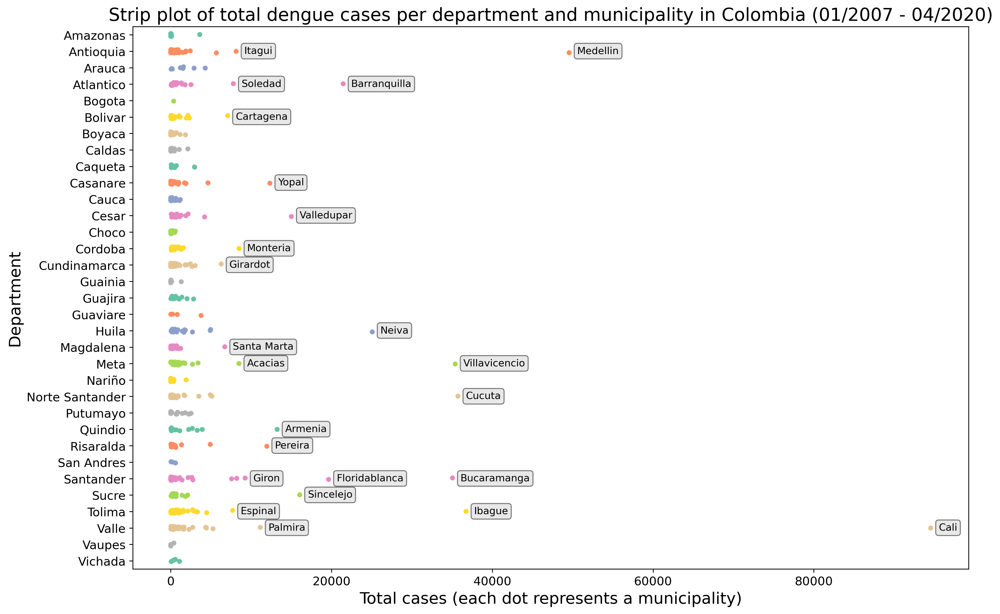

In [ ]:
fig, ax = plt.subplots(1,1,figsize=(15,10), dpi = 300)
palette = sns.color_palette("Set2", n_colors = 33)
g = sns.stripplot(data=df_compl, x='DENGUE', y='DEPARTAMENTO', ax = ax, palette = palette)



for row in df_compl.iterrows():
    if row[1]["MUNICIPIO"] in ["PIEDECUESTA","BARRANCABERMEJA"]:
        continue
    if row[1]["DENGUE"] > 6000:
        delta = 1000
        align = 'left'
        g.text(y=dic_alturas[row[1]["DEPARTAMENTO"]]+0.15, 
               x=row[1]["DENGUE"]+delta, 
               s=row[1]["MUNICIPIO"].title().replace("Martha","Marta"), 
               horizontalalignment=align, 
               size='small', 
               color='black',
               bbox = dict(boxstyle='round', facecolor='lightgray', alpha=0.5))



ax.set_title('Strip plot of total dengue cases per department and municipality in Colombia (01/2007 - 04/2020)', fontsize=18)
plt.xlabel('Total cases (each dot represents a municipality)', fontsize=16)
plt.ylabel('Department', fontsize=16)

Text(0, 0.5, 'Department')

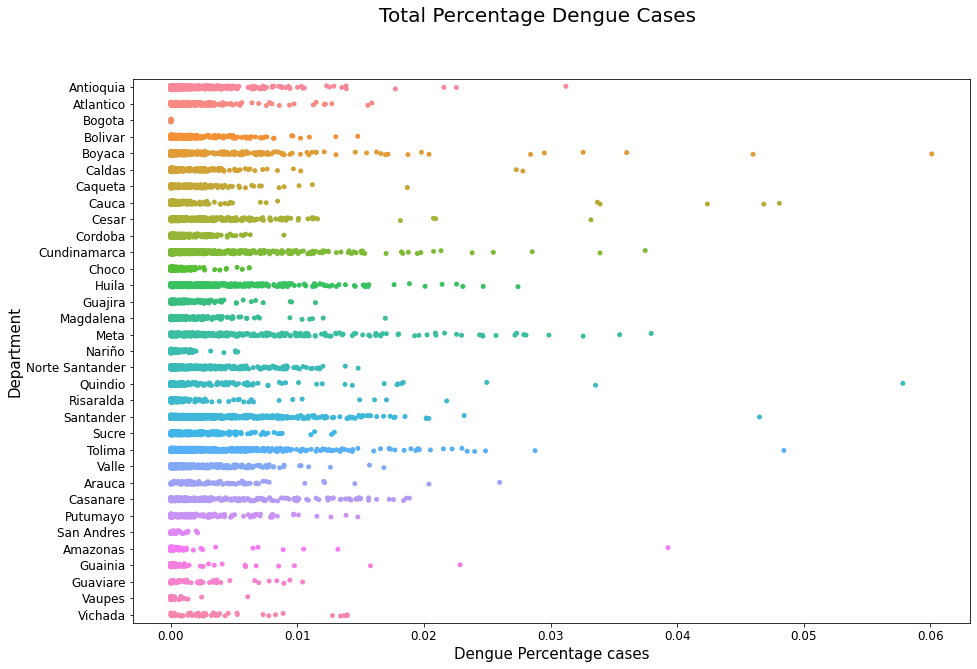

In [ ]:
fig = plt.figure(figsize=(15,10))
g = sns.stripplot(data=df_year, x='PCT TOTAL', y='DEPARTAMENTO')
fig.suptitle('Total Percentage Dengue Cases', fontsize=20)
plt.xlabel('Dengue Percentage cases', fontsize=15)
plt.ylabel('Department', fontsize=15)

Text(0.5, 1.0, 'Total dengue cases in Colombia (2007-2020)')

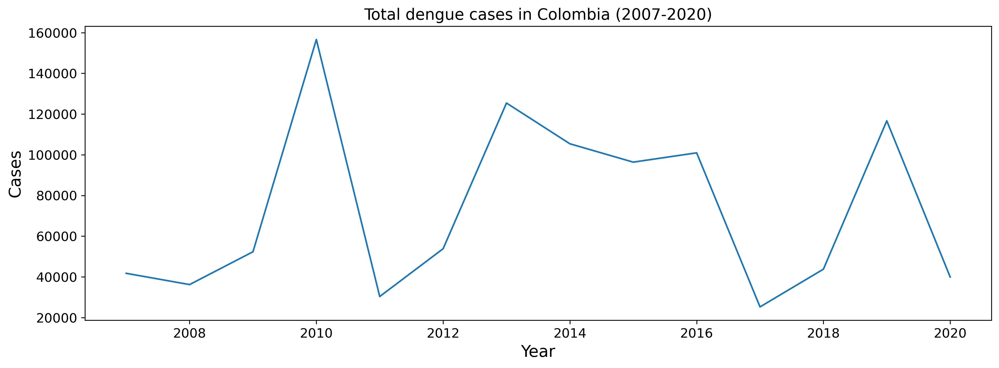

In [ ]:
df_group = df_year.groupby('ANO').sum()
df_group.reset_index(inplace=True)
df_group['PCT TOTAL'] = df_group['TOTAL'] / df_group['POBLACION']
df_group['PCT MORTALIDAD'] = df_group['MORTALIDAD POR DENGUE'] / df_group['POBLACION']
serie1 = df_group['TOTAL']
serie2 = df_group['MORTALIDAD POR DENGUE']

plt.figure(figsize=(15,5), dpi = 300)
ax = sns.lineplot(data=df_group, x='ANO', y='TOTAL')
#ax2 = ax.twinx()
#sns.scatterplot(data=df_group, x='ANO', y='MORTALIDAD POR DENGUE', color='red', ax=ax2, s=150)
ax.set_xlabel('Year', fontsize=15)
ax.set_ylabel('Cases', fontsize=15)
ax2.set_ylabel('Total Deaths by Dengue Cases', fontsize=15)
plt.title("Total dengue cases in Colombia (2007-2020)")

In [ ]:
df_group.sort_values('TOTAL', ascending=False)[['ANO', 'POBLACION', 'TOTAL', 'MORTALIDAD POR DENGUE']]

,ANO,POBLACION,TOTAL,MORTALIDAD POR DENGUE
3,2010,45095941.0,156624,280
6,2013,46706149.0,125408,182
12,2019,49956403.0,116669,69
7,2014,47246426.0,105392,165
9,2016,48331333.0,100940,125
8,2015,47787526.0,96367,154
5,2012,46167367.0,53817,88
2,2009,44565643.0,52321,49
11,2018,49416729.0,43762,64
0,2007,43514726.0,41733,24


Text(0, 0.5, 'Total Hemorrhagic Dengue Cases')

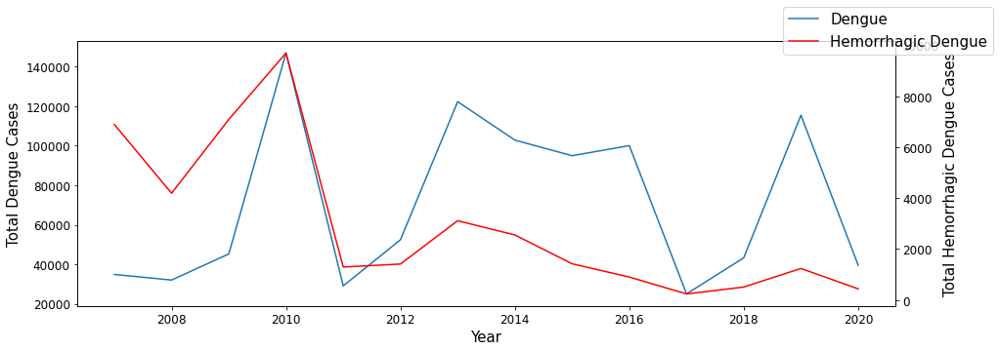

In [ ]:
df_group = df_year.groupby('ANO').sum()
df_group.reset_index(inplace=True)
plt.figure(figsize=(15,5))
ax = sns.lineplot(data=df_group, x='ANO', y='DENGUE', legend=False)
ax.grid(False)
ax2 = ax.twinx()
ax2.grid(False)
sns.lineplot(data=df_group, x='ANO', y='DENGUE GRAVE', color='red', ax=ax2, legend=False)
ax.figure.legend(['Dengue', 'Hemorrhagic Dengue'], fontsize=15)
ax.set_xlabel('Year', fontsize=15)
ax.set_ylabel('Total Dengue Cases', fontsize=15)
ax2.set_ylabel('Total Hemorrhagic Dengue Cases', fontsize=15)

In [ ]:
df_group.sort_values('TOTAL', ascending=False)[['ANO', 'POBLACION', 'DENGUE', 'DENGUE GRAVE']]

,ANO,POBLACION,DENGUE,DENGUE GRAVE
3,2010,45095941.0,146926,9698
6,2013,46706149.0,122297,3111
12,2019,49956403.0,115434,1235
7,2014,47246426.0,102841,2551
9,2016,48331333.0,100042,898
8,2015,47787526.0,94947,1420
5,2012,46167367.0,52408,1409
2,2009,44565643.0,45233,7088
11,2018,49416729.0,43256,506
0,2007,43514726.0,34843,6890


Text(0, 0.5, 'Total Dengue Cases')

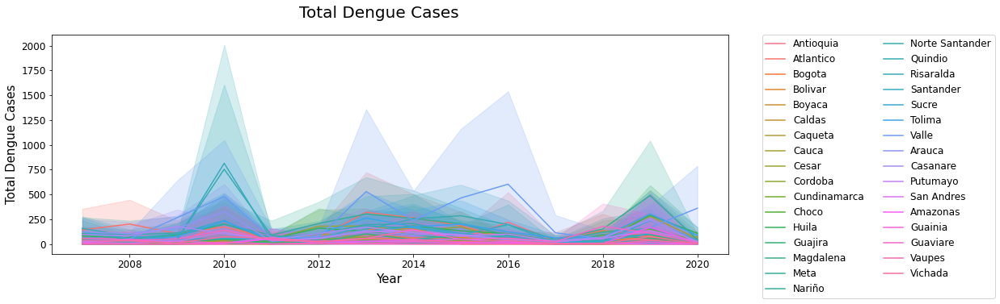

In [ ]:
fig = plt.figure(figsize=(15,5))
sns.lineplot(data=df_year, x='ANO', y='TOTAL', hue='DEPARTAMENTO')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., ncol=2)
fig.suptitle('Total Dengue Cases', fontsize=20)
plt.xlabel('Year', fontsize=15)
plt.ylabel('Total Dengue Cases', fontsize=15)

In [ ]:
df_year_dpto = df_year.groupby(['DEPARTAMENTO','COD_DPTO', 'ANO']).sum()
df_year_dpto['PCT TOTAL'] = df_year_dpto['TOTAL'] / df_year_dpto['POBLACION']
df_year_dpto['PCT MORTALIDAD'] = df_year_dpto['MORTALIDAD POR DENGUE'] / df_year_dpto['POBLACION']
df_year_dpto.reset_index(inplace=True)
df_year_dpto = df_year_dpto[~df_year_dpto['DEPARTAMENTO'].isin(['EXTERIOR', 'PROCEDENCIA DESCONOCIDA'])]
df_year_dpto

,DEPARTAMENTO,COD_DPTO,ANO,COD_MUNICIPIO,DENGUE,DENGUE GRAVE,MORTALIDAD POR DENGUE,POBLACION,TOTAL,PCT TOTAL,POR_100MIL,PCT MORTALIDAD
0,Amazonas,91,2007,914049,14,0,0,66470.0,14,0.000211,0.00009,0.000000
1,Amazonas,91,2008,914049,10,0,0,67262.0,10,0.000149,0.00007,0.000000
2,Amazonas,91,2009,914049,12,1,0,68067.0,13,0.000191,0.00010,0.000000
3,Amazonas,91,2010,914049,24,1,0,68863.0,25,0.000363,0.00022,0.000000
4,Amazonas,91,2011,914049,528,10,1,69648.0,538,0.007725,0.00531,0.000014
...,...,...,...,...,...,...,...,...,...,...,...,...
457,Vichada,99,2016,496922,173,7,0,73702.0,180,0.002442,0.00173,0.000000
458,Vichada,99,2017,496922,32,0,0,75468.0,32,0.000424,0.00030,0.000000
459,Vichada,99,2018,496922,15,0,0,77276.0,15,0.000194,0.00014,0.000000
460,Vichada,99,2019,496922,379,1,0,79134.0,380,0.004802,0.00376,0.000000


In [ ]:
lista = []
for i in df_year_dpto['ANO'].unique():
    df_group = df_year_dpto[df_year_dpto['ANO'] == i][['DEPARTAMENTO', 'MORTALIDAD POR DENGUE']]
    df_group.sort_values('MORTALIDAD POR DENGUE', ascending=False, inplace=True)
    lista.append(df_group[0:10])
df_top10 = pd.concat(lista).reset_index(drop=True)
df_top10['DEPARTAMENTO'].value_counts()[0:10]

Huila              11
Meta               11
Tolima             11
Valle              10
Norte Santander    10
Santander          10
Cesar               8
Atlantico           8
Cordoba             7
Magdalena           7
Name: DEPARTAMENTO, dtype: int64

Text(0, 0.5, 'Total Dengue Cases')

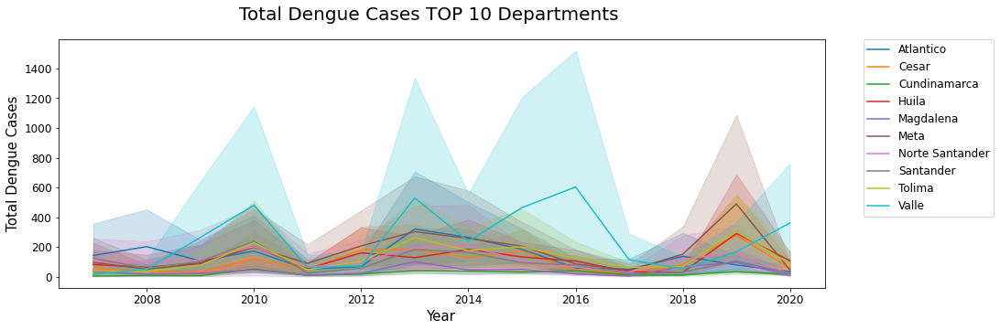

In [ ]:
departamentos_top10 = ['TOLIMA', 'META', 'HUILA', 'VALLE', 'SANTANDER', 'NORTE SANTANDER', 'CESAR', 'ATLANTICO', 'MAGDALENA', 'CUNDINAMARCA']
departamentos_top10 = [dep.title() for dep in departamentos_top10]
df_group = df_year[df_year['DEPARTAMENTO'].isin(departamentos_top10)]
fig = plt.figure(figsize=(15,5))
sns.lineplot(data=df_group, x='ANO', y='TOTAL', hue='DEPARTAMENTO')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
fig.suptitle('Total Dengue Cases TOP 10 Departments', fontsize=20)
plt.xlabel('Year', fontsize=15)
plt.ylabel('Total Dengue Cases', fontsize=15)

In [ ]:
lista = []
for i in df_year['ANO'].unique():
    df_group = df_year[df_year['ANO'] == i][['DEPARTAMENTO', 'MUNICIPIO', 'MORTALIDAD POR DENGUE']]
    df_group.sort_values('MORTALIDAD POR DENGUE', ascending=False, inplace=True)
    lista.append(df_group[0:10])
df_top10 = pd.concat(lista).reset_index(drop=True)
df_top10['MUNICIPIO'].value_counts()[0:10]

CALI             9
CUCUTA           9
IBAGUE           8
VILLAVICENCIO    7
BUCARAMANGA      6
NEIVA            5
RIOHACHA         5
SOLEDAD          4
VALLEDUPAR       4
ESPINAL          3
Name: MUNICIPIO, dtype: int64

C:\ProgramData\Miniconda3\envs\dl\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


Text(0, 0.5, 'Dengue cases per year')

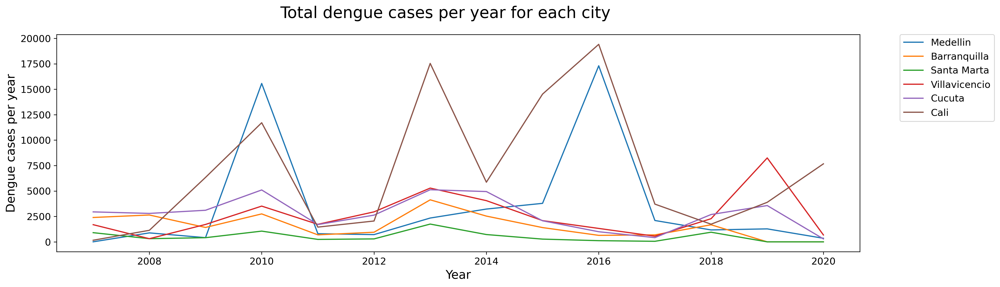

In [ ]:

municipios_top10 = ['CUCUTA', 'CALI', 'VILLAVICENCIO', 'BARRANQUILLA', 'SANTA MARTA', 'MEDELLIN']
df_group = df_year[df_year['MUNICIPIO'].isin(municipios_top10)]
df_group["MUNICIPIO"] = df_group["MUNICIPIO"].str.title()
fig = plt.figure(figsize=(18,5), dpi = 300)
sns.lineplot(data=df_group, x='ANO', y='TOTAL', hue='MUNICIPIO')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
fig.suptitle('Total dengue cases per year for each city', fontsize=20)
plt.xlabel('Year', fontsize=15)
plt.ylabel('Dengue cases per year', fontsize=15)

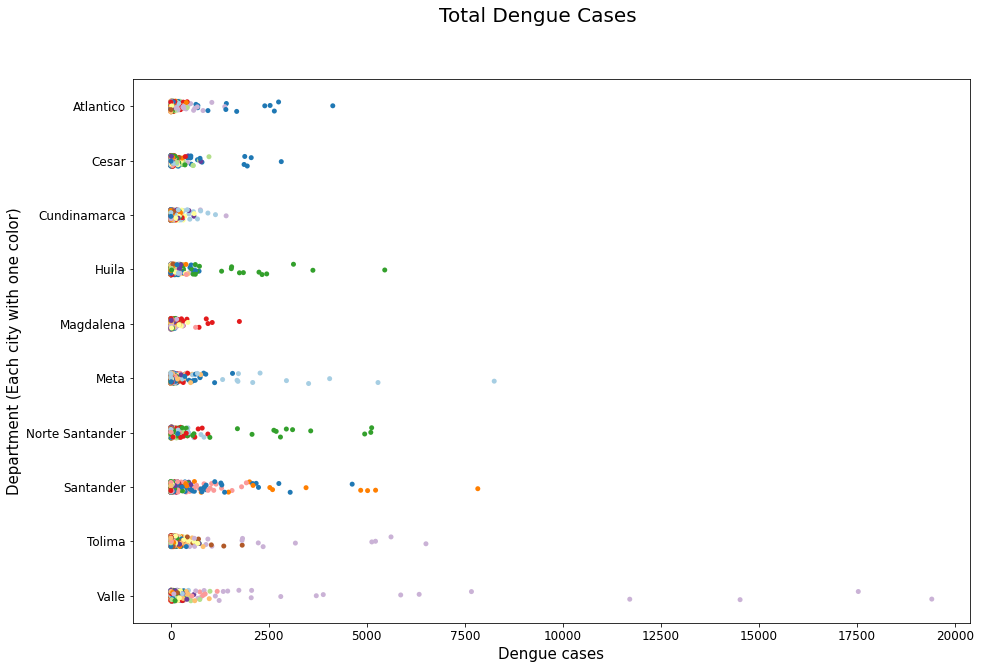

In [ ]:
df_group = df_year[df_year['DEPARTAMENTO'].isin(departamentos_top10)]
fig = plt.figure(figsize=(15,10))
g = sns.stripplot(data=df_group, x='TOTAL', y='DEPARTAMENTO', hue='MUNICIPIO', palette="Paired")
fig.suptitle('Total Dengue Cases', fontsize=20)
plt.xlabel('Dengue cases', fontsize=15)
plt.ylabel('Department (Each city with one color)', fontsize=15)
plt.legend().remove()

Text(0.5, 0.98, 'Dengue cases per year vs height above sea (each dot is a municipality)')

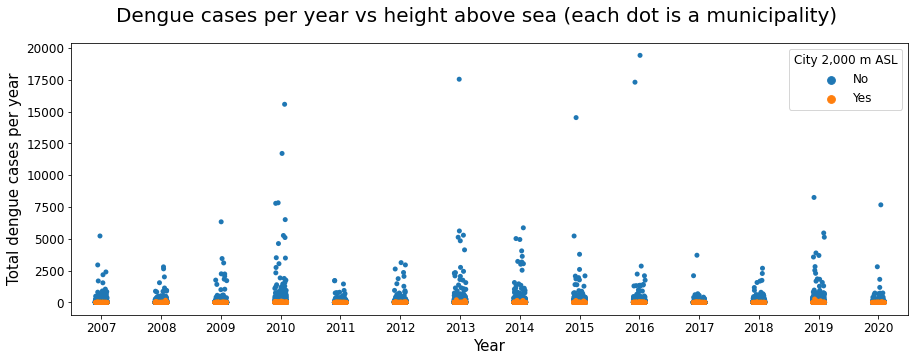

In [ ]:
df_year_alt = df_year.copy()
df_year_alt['COD_MUNICIPIO'] = df_year_alt['COD_MUNICIPIO'].astype(int)
df_year_alt = df_year_alt.join(df_dep_mun[['COD_MUNICIPIO', 'LATITUD', 'LONGITUD', 'ELEVACION']].set_index('COD_MUNICIPIO'), on='COD_MUNICIPIO', rsuffix='t1_')
df_year_alt = df_year_alt[~df_year_alt['ELEVACION'].isna()]
df_year_alt.reset_index(inplace=True)
df_year_alt['City 2,000 m ASL'] = df_year_alt['ELEVACION'].apply(lambda x: 'Yes' if x > 2000 else 'No')
df_year_alt = df_year_alt.sort_values(by='City 2,000 m ASL')

fig = plt.figure(figsize=(15,5))
sns.stripplot(data=df_year_alt, x='ANO', y='TOTAL', hue='City 2,000 m ASL')
plt.xlabel('Year', fontsize=15)
plt.ylabel('Total dengue cases per year', fontsize=15)
fig.suptitle('Dengue cases per year vs height above sea (each dot is a municipality)', fontsize=20)

Text(0.5, 0.98, 'Dengue cases vs Elevation above sea level')

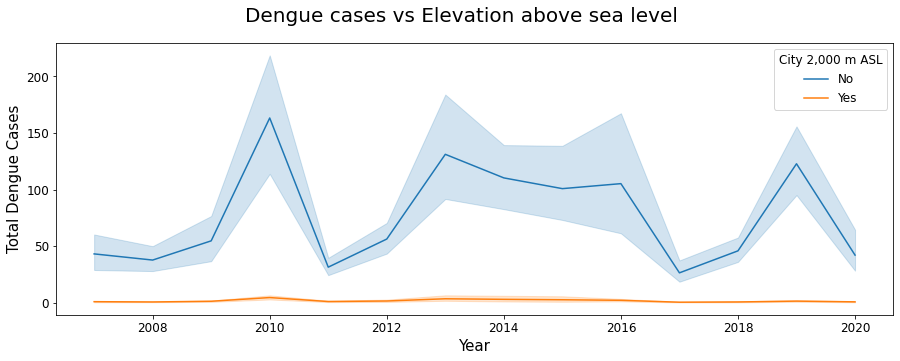

In [ ]:
fig = plt.figure(figsize=(15,5))
sns.lineplot(data=df_year_alt, x='ANO', y='TOTAL',  hue='City 2,000 m ASL')
plt.xlabel('Year', fontsize=15)
plt.ylabel('Total Dengue Cases', fontsize=15)
fig.suptitle('Dengue cases vs Elevation above sea level', fontsize=20)

Text(0.5, 0.98, 'Deaths by dengue vs Height above sea')

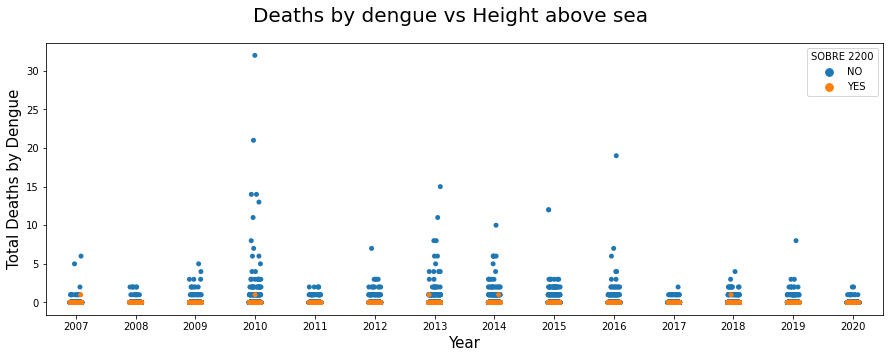

In [ ]:
df_year_alt = df_year.copy()
df_year_alt['COD_MUNICIPIO'] = df_year_alt['COD_MUNICIPIO'].astype(int)
df_year_alt = df_year_alt.join(df_dep_mun[['COD_MUNICIPIO', 'LATITUD', 'LONGITUD', 'ELEVACION']].set_index('COD_MUNICIPIO'), on='COD_MUNICIPIO', rsuffix='t1_')
df_year_alt = df_year_alt[~df_year_alt['ELEVACION'].isna()]
df_year_alt.reset_index(inplace=True)
df_year_alt['SOBRE 2200'] = df_year_alt['ELEVACION'].apply(lambda x: 'YES' if x > 2200 else 'NO')
df_year_alt = df_year_alt.sort_values(by='SOBRE 2200')

fig = plt.figure(figsize=(15,5))
sns.stripplot(data=df_year_alt, x='ANO', y='MORTALIDAD POR DENGUE', hue='SOBRE 2200')
plt.xlabel('Year', fontsize=15)
plt.ylabel('Total Deaths by Dengue', fontsize=15)
fig.suptitle('Deaths by dengue vs Height above sea', fontsize=20)

Text(0.5, 0.98, 'Deaths by dengue vs Height above sea')

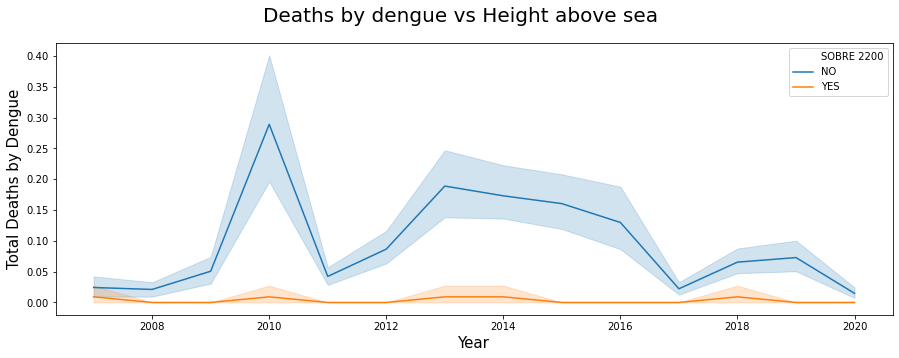

In [ ]:
fig = plt.figure(figsize=(15,5))
sns.lineplot(data=df_year_alt, x='ANO', y='MORTALIDAD POR DENGUE', hue='City 2,000 m ASL')
plt.xlabel('Year', fontsize=15)
plt.ylabel('Total Deaths by Dengue', fontsize=15)
fig.suptitle('Deaths by dengue vs Height above sea', fontsize=20)

In [ ]:
# color scheme
var_name = 'PCT TOTAL'
ano_grafica = 2016
df_group = df_year_dpto.copy()
df_group = df_group.groupby(['COD_DPTO', 'ANO']).mean().reset_index()
df_group['COD_DPTO'] = df_group['COD_DPTO'].apply(lambda x: str(x).zfill(2))
df_group.set_index('COD_DPTO', inplace=True)
df_group = df_group[df_group['ANO'] == ano_grafica][var_name]
min_cn, max_cn = df_group.quantile([0.01,0.99])
colormap = branca.colormap.LinearColormap(
    colors=['white','yellow','orange','red','darkred'],
    vmin=min_cn,
    vmax=max_cn
)
colormap.caption="Total percentual dengue in Colombia " + str(ano_grafica)
dpto_orig = geopandas.read_file("Data\Colombia.geo.json", driver = "GeoJSON")
dpto_data = dpto_orig.join(df_group, how = "left", on = "DPTO")
dpto_data.fillna(0, inplace = True)

map_colombia = folium.Map(location=[4.5709, -82.2973],
                        zoom_start=6,
                        tiles="CartoDB positron")

style_function = lambda x: {
    'fillColor': colormap(x['properties'][var_name]),
    'color': 'black',
    'weight':1,
    'fillOpacity':0.5
}

stategeo = folium.GeoJson(
    dpto_data.to_json(),
    name='Chicago beats',
    style_function=style_function,
    tooltip=folium.GeoJsonTooltip(
        fields=['NOMBRE_DPT', var_name],
        aliases=['Departamento:', 'Dengue:'],
        localize=True
    )
).add_to(map_colombia)

colormap.add_to(map_colombia)
map_colombia

In [ ]:
var_name = 'PCT TOTAL'
ano_grafica = 2016
map_colombia = folium.Map(location=[4.5709, -82.2973],
                        zoom_start=6,
                        tiles="CartoDB positron")

df_group = df_year_alt[df_year_alt['ANO'] == ano_grafica]
df_group.reset_index(drop=True, inplace=True)
q20,q40,q60,q80 = df_group[var_name].quantile([0.2,0.4,0.6,0.8])

for i in range(0,len(df_group)):
    value = df_group[var_name][i]
    color = 'white' if value < q20 else 'yellow' if value < q40 else 'orange' if value < q60 else 'red' if value < q80 else 'darkred'
    radius = 1 if value < q20 else 2 if value < q40 else 3 if value < q60 else 5 if value < q80 else 8
    marker = folium.CircleMarker(location=[df_group['LATITUD'][i],df_group['LONGITUD'][i]], radius=radius, color=None, fill=True, fill_color=color, fill_opacity=0.5, border_opacity=0.5)
    marker.add_to(map_colombia)
map_colombia

In [ ]:
def folium_slider(index_lab, var_name = "TOTAL"):
    # get colorbar
    df_group = df_year_dpto.copy()
    df_group = df_group.groupby(['COD_DPTO', 'ANO']).mean().reset_index()
    df_group['COD_DPTO'] = df_group['COD_DPTO'].apply(lambda x: str(x).zfill(2))
    df_group.set_index('COD_DPTO', inplace=True)
    min_cn, max_cn = df_group[var_name].quantile([0.01,0.99])
    
    colormap = branca.colormap.LinearColormap(
        colors=['white','yellow','orange','red','darkred'],
        vmin=min_cn,
        vmax=max_cn
    )
    colormap.caption = "Dengue Colombia"
    
    styledata = {}
    for beat in range(dpto_orig.shape[0]):
        df_group = df_year_dpto.groupby(['COD_DPTO', 'ANO'])[var_name].sum()
        res_beat = df_group.reset_index()
        res_beat = res_beat[res_beat['COD_DPTO'] == (int)(dpto_orig.iloc[beat,:].DPTO)][['ANO', var_name]]
        res_beat = res_beat.set_index('ANO')
        c_count = res_beat.fillna(0)
        c_count[var_name] = c_count[var_name]
        df_tmp = pd.DataFrame(
            {'color': [colormap(count) for count in c_count[var_name]], 'opacity':0.5},
            index = index_lab
        )
        styledata[str(beat)] = df_tmp

    map_colombia = folium.Map(location=[4.5709, -74.2973],
                            zoom_start=6,
                            tiles="CartoDB positron")

    styledict = {str(dpto): data.to_dict(orient='index') for dpto, data in styledata.items()}

    g = TimeSliderChoropleth(
        dpto_orig.to_json(),
        styledict=styledict
    ).add_to(map_colombia)

    folium.GeoJson(dpto_orig.to_json(), style_function = lambda x: {
        'color': 'black',
        'weight':1,
        'fillOpacity':0
    }, tooltip=folium.GeoJsonTooltip(
            fields=['NOMBRE_DPT'],
            aliases=['Departamento:'],
            localize=True
        )).add_to(map_colombia)

    colormap.add_to(map_colombia)
    return map_colombia
datetime_index = pd.date_range('2007', periods=14, freq='Y')
dt_index_ints = datetime_index.astype(int) // 10**9
dt_index = dt_index_ints.astype(str)
folium_slider(dt_index, var_name = 'TOTAL')

In [ ]:
datetime_index = pd.date_range('2007', periods=14, freq='Y')
dt_index_ints = datetime_index.astype(int) // 10**9
dt_index = dt_index_ints.astype(str)
folium_slider(dt_index, var_name = 'PCT TOTAL')